# **Data Science Project**
*Omar Ebrahim, Zeiad Nouby, Youssef Ashraf*

**STEP 0: Frame the Problem:**
- What were the pre-processing steps used that made the most difference in this data?
- Which classifier models were best for Diagnosis and Glaucoma Type?
- What were the results obtained from the clustering algorithm selected for this problem? (K-Means, DBScan, Agglomerative)

The following problems we are looking to solve:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import RobustScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN
from sklearn_extra.cluster import KMedoids
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from sklearn.feature_selection import SelectKBest, f_classif

from xgboost import XGBClassifier
from itertools import product
from scipy.stats import chi2_contingency

In [2]:
df = pd.read_csv('glaucoma_dataset.csv')

**STEP 2: Prepare Data**

2.1: Exploring and Visualizing

In [3]:
# Useful information, especially the type of variable of each feature.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Patient ID                                  10000 non-null  int64  
 1   Age                                         10000 non-null  int64  
 2   Gender                                      10000 non-null  object 
 3   Visual Acuity Measurements                  10000 non-null  object 
 4   Intraocular Pressure (IOP)                  10000 non-null  float64
 5   Cup-to-Disc Ratio (CDR)                     10000 non-null  float64
 6   Family History                              10000 non-null  object 
 7   Medical History                             7453 non-null   object 
 8   Medication Usage                            8769 non-null   object 
 9   Visual Field Test Results                   10000 non-null  object 
 10  Optical Coh

In [4]:
# General description of the dataset.
df.describe()

,Patient ID,Age,Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Pachymetry
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000
mean,50002.16880,53.872200,17.507527,0.548437,549.733974
std,28939.82498,21.127563,4.356101,0.144326,28.902741
min,4.00000,18.000000,10.000000,0.300000,500.010000
25%,24660.25000,36.000000,13.760000,0.420000,524.590000
50%,50091.50000,54.000000,17.485000,0.550000,549.335000
75%,74829.25000,72.000000,21.300000,0.670000,574.972500
max,99992.00000,90.000000,25.000000,0.800000,599.990000


In [5]:
# A surface-level preview of what the data looks like especially after the ; separator being implemented.
df.head()

,Patient ID,Age,Gender,Visual Acuity Measurements,Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Family History,Medical History,Medication Usage,Visual Field Test Results,Optical Coherence Tomography (OCT) Results,Pachymetry,Cataract Status,Angle Closure Status,Visual Symptoms,Diagnosis,Glaucoma Type
0,62431,69,Male,LogMAR 0.1,19.46,0.42,No,Diabetes,"Amoxicillin, Lisinopril, Omeprazole, Atorvasta...","Sensitivity: 0.54, Specificity: 0.75","RNFL Thickness: 86.48 µm, GCC Thickness: 64.14...",541.51,Present,Open,"Tunnel vision, Eye pain, Nausea",No Glaucoma,Primary Open-Angle Glaucoma
1,68125,69,Female,LogMAR 0.1,18.39,0.72,No,Hypertension,"Lisinopril, Amoxicillin, Atorvastatin, Ibuprof...","Sensitivity: 0.72, Specificity: 0.88","RNFL Thickness: 96.88 µm, GCC Thickness: 56.48...",552.77,Absent,Open,"Redness in the eye, Vision loss, Tunnel vision",No Glaucoma,Juvenile Glaucoma
2,63329,67,Female,20/40,23.65,0.72,No,Hypertension,"Amoxicillin, Ibuprofen, Metformin, Atorvastati...","Sensitivity: 0.56, Specificity: 0.8","RNFL Thickness: 89.81 µm, GCC Thickness: 59.05...",573.65,Absent,Closed,"Halos around lights, Vision loss, Redness in t...",No Glaucoma,Juvenile Glaucoma
3,47174,23,Male,LogMAR 0.0,18.04,0.61,No,NaN,"Ibuprofen, Aspirin","Sensitivity: 0.6, Specificity: 0.93","RNFL Thickness: 87.25 µm, GCC Thickness: 63.98...",590.67,Absent,Closed,"Nausea, Nausea, Halos around lights",No Glaucoma,Congenital Glaucoma
4,67361,21,Male,LogMAR 0.1,15.87,0.30,No,Diabetes,"Amoxicillin, Omeprazole, Aspirin, Ibuprofen, A...","Sensitivity: 0.82, Specificity: 0.9","RNFL Thickness: 82.61 µm, GCC Thickness: 66.01...",588.41,Absent,Closed,"Eye pain, Eye pain, Tunnel vision",No Glaucoma,Primary Open-Angle Glaucoma


In [6]:
# Feature names.
df.columns

Index(['Patient ID', 'Age', 'Gender', 'Visual Acuity Measurements',
       'Intraocular Pressure (IOP)', 'Cup-to-Disc Ratio (CDR)',
       'Family History', 'Medical History', 'Medication Usage',
       'Visual Field Test Results',
       'Optical Coherence Tomography (OCT) Results', 'Pachymetry',
       'Cataract Status', 'Angle Closure Status', 'Visual Symptoms',
       'Diagnosis', 'Glaucoma Type'],
      dtype='object')

For better visualization, we separated non-atomic columns into multiple columns of continuous values, the following was changed:
- Visual Field Test Results -> Sensitivity and Specifity.
- OCT Results -> RNF Thickness, GCC Thickness, Retinal Volume, and Macular Thickness.

In [7]:
# Splitting the columns.
df[['Sensitivity', 'Specificity']] = df['Visual Field Test Results'].str.extract('Sensitivity: (\d+\.\d+), Specificity: (\d+\.\d+)', expand=True)
df[['RNFL Thickness', 'GCC Thickness', 'Retinal Volume', 'Macular Thickness']] = df['Optical Coherence Tomography (OCT) Results'].str.extract(
'RNFL Thickness: ([\d.]+) µm, GCC Thickness: ([\d.]+) µm, Retinal Volume: ([\d.]+) mm³, Macular Thickness: ([\d.]+) µm', expand=True)
df['Visual Acuity Measurements (LogMAR)'] = df['Visual Acuity Measurements']

# Converting column type.
df['Sensitivity'] = pd.to_numeric(df['Sensitivity'])
df['Specificity'] = pd.to_numeric(df['Specificity'])
df['RNFL Thickness'] = pd.to_numeric(df['RNFL Thickness'])
df['GCC Thickness'] = pd.to_numeric(df['GCC Thickness'])
df['Retinal Volume'] = pd.to_numeric(df['Retinal Volume'])
df['Macular Thickness'] = pd.to_numeric(df['Macular Thickness'])

# Dropping old columns.
df = df.drop(columns=['Visual Field Test Results', 'Optical Coherence Tomography (OCT) Results', 'Visual Acuity Measurements'])

# Reformatting the order of the columns.
newColumn = ['Patient ID', 'Age', 'Gender', 'Visual Acuity Measurements (LogMAR)', 'Intraocular Pressure (IOP)', 'Cup-to-Disc Ratio (CDR)', 'Family History', 
                'Medical History', 'Medication Usage', 'Pachymetry', 'Angle Closure Status', 'Visual Symptoms',  'Sensitivity', 'Specificity',
                  'RNFL Thickness','GCC Thickness', 'Retinal Volume', 'Macular Thickness', 'Diagnosis', 'Glaucoma Type']
df = df[newColumn]

df

,Patient ID,Age,Gender,Visual Acuity Measurements (LogMAR),Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Family History,Medical History,Medication Usage,Pachymetry,Angle Closure Status,Visual Symptoms,Sensitivity,Specificity,RNFL Thickness,GCC Thickness,Retinal Volume,Macular Thickness,Diagnosis,Glaucoma Type
0,62431,69,Male,LogMAR 0.1,19.46,0.42,No,Diabetes,"Amoxicillin, Lisinopril, Omeprazole, Atorvasta...",541.51,Open,"Tunnel vision, Eye pain, Nausea",0.54,0.75,86.48,64.14,5.63,283.67,No Glaucoma,Primary Open-Angle Glaucoma
1,68125,69,Female,LogMAR 0.1,18.39,0.72,No,Hypertension,"Lisinopril, Amoxicillin, Atorvastatin, Ibuprof...",552.77,Open,"Redness in the eye, Vision loss, Tunnel vision",0.72,0.88,96.88,56.48,5.69,261.48,No Glaucoma,Juvenile Glaucoma
2,63329,67,Female,20/40,23.65,0.72,No,Hypertension,"Amoxicillin, Ibuprofen, Metformin, Atorvastati...",573.65,Closed,"Halos around lights, Vision loss, Redness in t...",0.56,0.80,89.81,59.05,5.96,282.34,No Glaucoma,Juvenile Glaucoma
3,47174,23,Male,LogMAR 0.0,18.04,0.61,No,NaN,"Ibuprofen, Aspirin",590.67,Closed,"Nausea, Nausea, Halos around lights",0.60,0.93,87.25,63.98,6.44,262.86,No Glaucoma,Congenital Glaucoma
4,67361,21,Male,LogMAR 0.1,15.87,0.30,No,Diabetes,"Amoxicillin, Omeprazole, Aspirin, Ibuprofen, A...",588.41,Closed,"Eye pain, Eye pain, Tunnel vision",0.82,0.90,82.61,66.01,6.16,261.78,No Glaucoma,Primary Open-Angle Glaucoma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,61720,81,Female,LogMAR 0.1,22.83,0.49,No,NaN,NaN,576.53,Open,"Eye pain, Eye pain, Tunnel vision",0.81,0.97,83.41,66.55,5.92,275.25,Glaucoma,Normal-Tension Glaucoma
9996,34983,65,Male,LogMAR 0.0,11.72,0.54,No,Diabetes,Lisinopril,548.10,Open,"Eye pain, Halos around lights, Vomiting",0.70,0.97,83.04,63.24,6.13,268.39,No Glaucoma,Normal-Tension Glaucoma
9997,67810,56,Female,20/40,10.67,0.56,Yes,Diabetes,Ibuprofen,513.74,Open,"Vision loss, Vomiting, Blurred vision",0.80,0.90,95.93,59.78,5.85,280.84,No Glaucoma,Secondary Glaucoma
9998,34285,26,Male,LogMAR 0.1,23.37,0.74,No,Glaucoma in family,NaN,585.03,Closed,"Halos around lights, Nausea, Nausea",0.68,0.90,92.84,69.35,5.54,270.12,Glaucoma,Normal-Tension Glaucoma


Patient ID, Medication Usage, and Visual Symptoms do not give us any information that we can use for data analysis.

**We call for a domain/field expert for the purpose of providing more informative results in the future such that we do not drop the columns.**

In [8]:
df = df.drop(columns=['Patient ID', 'Medication Usage', 'Visual Symptoms'])
df = df.fillna(value= "No Medical History", axis=1)
df

,Age,Gender,Visual Acuity Measurements (LogMAR),Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Family History,Medical History,Pachymetry,Angle Closure Status,Sensitivity,Specificity,RNFL Thickness,GCC Thickness,Retinal Volume,Macular Thickness,Diagnosis,Glaucoma Type
0,69,Male,LogMAR 0.1,19.46,0.42,No,Diabetes,541.51,Open,0.54,0.75,86.48,64.14,5.63,283.67,No Glaucoma,Primary Open-Angle Glaucoma
1,69,Female,LogMAR 0.1,18.39,0.72,No,Hypertension,552.77,Open,0.72,0.88,96.88,56.48,5.69,261.48,No Glaucoma,Juvenile Glaucoma
2,67,Female,20/40,23.65,0.72,No,Hypertension,573.65,Closed,0.56,0.8,89.81,59.05,5.96,282.34,No Glaucoma,Juvenile Glaucoma
3,23,Male,LogMAR 0.0,18.04,0.61,No,No Medical History,590.67,Closed,0.6,0.93,87.25,63.98,6.44,262.86,No Glaucoma,Congenital Glaucoma
4,21,Male,LogMAR 0.1,15.87,0.3,No,Diabetes,588.41,Closed,0.82,0.9,82.61,66.01,6.16,261.78,No Glaucoma,Primary Open-Angle Glaucoma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,81,Female,LogMAR 0.1,22.83,0.49,No,No Medical History,576.53,Open,0.81,0.97,83.41,66.55,5.92,275.25,Glaucoma,Normal-Tension Glaucoma
9996,65,Male,LogMAR 0.0,11.72,0.54,No,Diabetes,548.1,Open,0.7,0.97,83.04,63.24,6.13,268.39,No Glaucoma,Normal-Tension Glaucoma
9997,56,Female,20/40,10.67,0.56,Yes,Diabetes,513.74,Open,0.8,0.9,95.93,59.78,5.85,280.84,No Glaucoma,Secondary Glaucoma
9998,26,Male,LogMAR 0.1,23.37,0.74,No,Glaucoma in family,585.03,Closed,0.68,0.9,92.84,69.35,5.54,270.12,Glaucoma,Normal-Tension Glaucoma


Encoding the categorical data.

In [9]:
df['Gender'] = df['Gender'].replace({'Male': 1, 'Female': 2})
df['Family History'] = df['Family History'].replace({'No': 0, 'Yes': 1})
df['Medical History'] = df['Medical History'].replace({'No Medical History': 0, 'Diabetes': 1, 'Hypertension': 2, 'Glaucoma in family': 3})
df['Angle Closure Status'] = df['Angle Closure Status'].replace({'Closed': 0, 'Open': 1})
df['Diagnosis'] = df['Diagnosis'].replace({'No Glaucoma': 0, 'Glaucoma': 1})
df['Glaucoma Type'] = df['Glaucoma Type'].replace({'Angle-Closure Glaucoma': 1, 'Congenital Glaucoma': 2, 'Juvenile Glaucoma':3, 
                                                   'Normal-Tension Glaucoma':4, 'Primary Open-Angle Glaucoma':5, 'Secondary Glaucoma':6})
df['Visual Acuity Measurements (LogMAR)'] = df['Visual Acuity Measurements (LogMAR)'].replace({'LogMAR 0.0': 0.0, 'LogMAR 0.1': 0.1, '20/40':0.3, '20/20': 0.0})
df

,Age,Gender,Visual Acuity Measurements (LogMAR),Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Family History,Medical History,Pachymetry,Angle Closure Status,Sensitivity,Specificity,RNFL Thickness,GCC Thickness,Retinal Volume,Macular Thickness,Diagnosis,Glaucoma Type
0,69,1,0.1,19.46,0.42,0,1,541.51,1,0.54,0.75,86.48,64.14,5.63,283.67,0,5
1,69,2,0.1,18.39,0.72,0,2,552.77,1,0.72,0.88,96.88,56.48,5.69,261.48,0,3
2,67,2,0.3,23.65,0.72,0,2,573.65,0,0.56,0.8,89.81,59.05,5.96,282.34,0,3
3,23,1,0.0,18.04,0.61,0,0,590.67,0,0.6,0.93,87.25,63.98,6.44,262.86,0,2
4,21,1,0.1,15.87,0.3,0,1,588.41,0,0.82,0.9,82.61,66.01,6.16,261.78,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,81,2,0.1,22.83,0.49,0,0,576.53,1,0.81,0.97,83.41,66.55,5.92,275.25,1,4
9996,65,1,0.0,11.72,0.54,0,1,548.1,1,0.7,0.97,83.04,63.24,6.13,268.39,0,4
9997,56,2,0.3,10.67,0.56,1,1,513.74,1,0.8,0.9,95.93,59.78,5.85,280.84,0,6
9998,26,1,0.1,23.37,0.74,0,3,585.03,0,0.68,0.9,92.84,69.35,5.54,270.12,1,4


Visualizing the quantitative features.

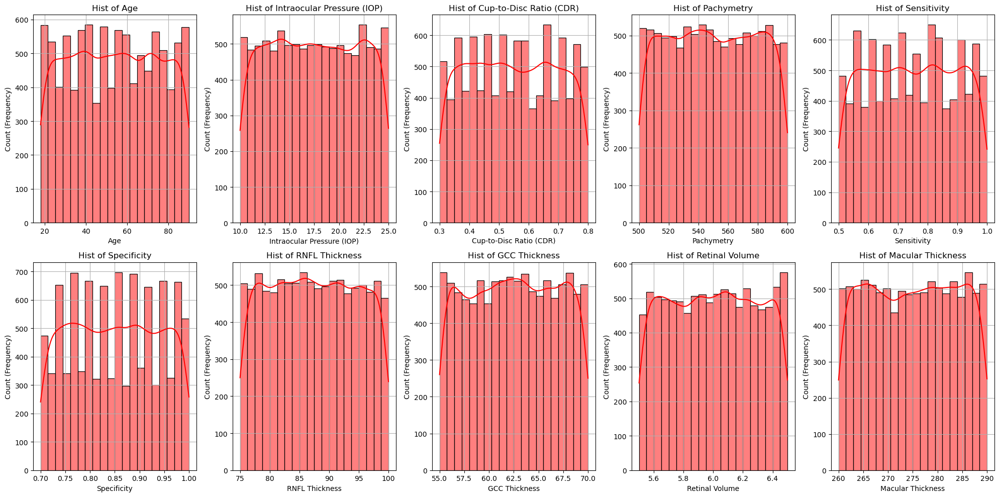

In [10]:
# I used a histogram here to visualize the general trends of the quantitiative features.
quantitativeFeatures = np.array(['Age', 'Intraocular Pressure (IOP)', 'Cup-to-Disc Ratio (CDR)',
                                  'Pachymetry', 'Sensitivity', 'Specificity', 'RNFL Thickness',
                                  'GCC Thickness', 'Retinal Volume', 'Macular Thickness'])

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))

for i, feature in enumerate(quantitativeFeatures):
    row = i // 5  
    col = i % 5 
    sns.histplot(df[feature], bins=20, color='red', ax=axes[row, col], kde=True)
    axes[row, col].set_xlabel(f'{feature}')
    axes[row, col].set_ylabel('Count (Frequency)')
    axes[row, col].set_title(f"Hist of {feature}")
    axes[row, col].grid(True)

plt.tight_layout()
plt.show()

We find here that besides of these distributions are either uniformly distributed or multimodal distribution, indicating very small variance which will be sufficient for us during the outlier detection phase. Moreover, the distribution helped us conclude the type of scaling method to use.

Visualizing the qualitative features.

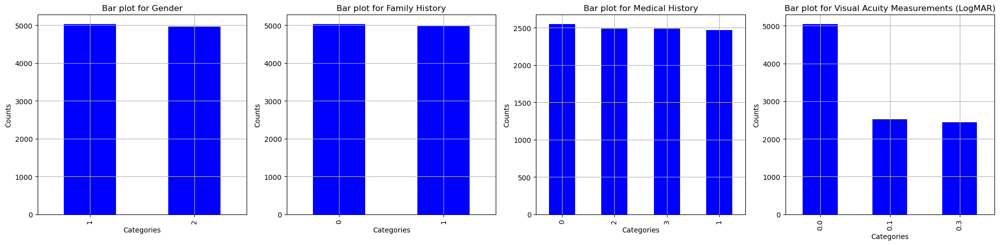

In [11]:
qualitativeFeatures = ['Gender', 'Family History', 'Medical History', 'Visual Acuity Measurements (LogMAR)']
fig, axes = plt.subplots(nrows=1, ncols=len(qualitativeFeatures), figsize=(20, 5))

for i, cat in enumerate(qualitativeFeatures):
    counts = df[cat].value_counts()
    counts.plot(kind='bar', ax=axes[i], color='blue')
    axes[i].set_xlabel('Categories')
    axes[i].set_ylabel('Counts')
    axes[i].set_title(f"Bar plot for {cat}")
    axes[i].grid(True)
    
plt.tight_layout()
plt.show()

The first 3 plots indicate nearly equal observations for each category.

LogMAR however had more cases of 0.0 vision in comparison to 0.1 and 0.3.

Visualizing the quantitative multivariate features.

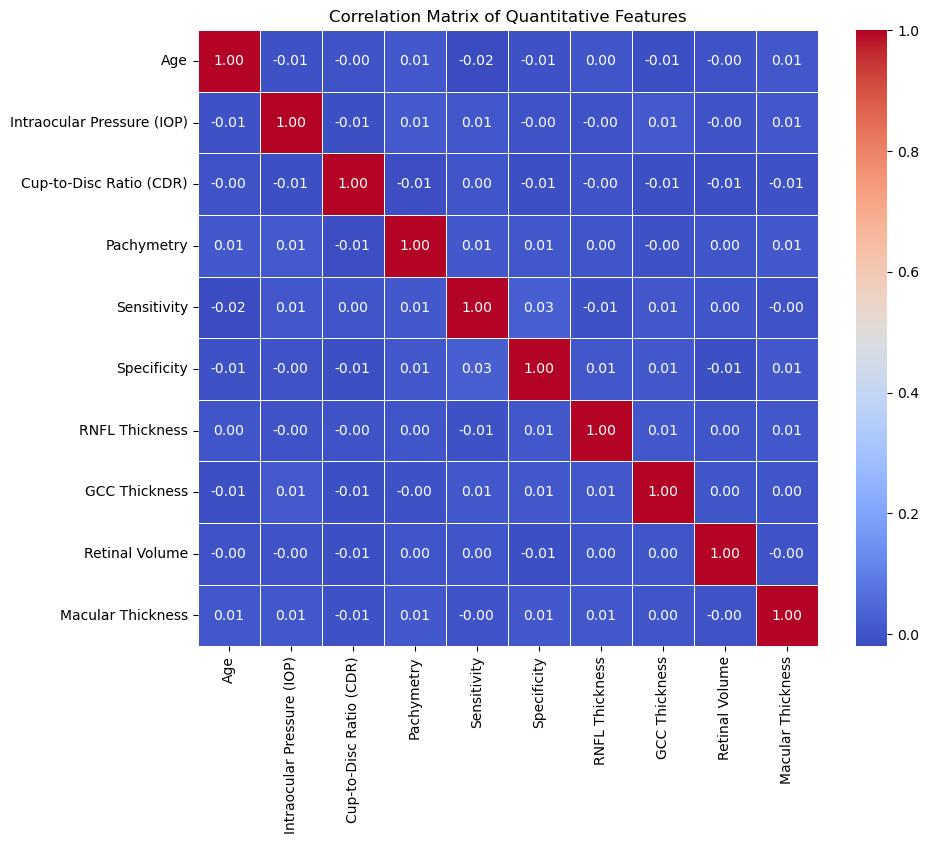

In [12]:
quantitativeDF = df[quantitativeFeatures]

correlationMatrix = quantitativeDF.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlationMatrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Quantitative Features')
plt.show()

This matrix indicates almost no correlation between the quantitative independent features because they either give the correlation value of 0, or they are very close to 0.

**2.2) Pre-Processing**

*a) Null Value Treatment.*

In [13]:
df.isnull().sum()

Age                                    0
Gender                                 0
Visual Acuity Measurements (LogMAR)    0
Intraocular Pressure (IOP)             0
Cup-to-Disc Ratio (CDR)                0
Family History                         0
Medical History                        0
Pachymetry                             0
Angle Closure Status                   0
Sensitivity                            0
Specificity                            0
RNFL Thickness                         0
GCC Thickness                          0
Retinal Volume                         0
Macular Thickness                      0
Diagnosis                              0
Glaucoma Type                          0
dtype: int64

*b) Splitting the independent and dependent features.*

In [14]:
# This will be used later when we get to the model training.
X = df.drop(['Diagnosis', 'Glaucoma Type'], axis=1)
y1 = df['Diagnosis']
y2 = df['Glaucoma Type']
X.shape

(10000, 15)

*c) Outlier treatment.*
- Univariate Outlier Detection (Tukey's Boxplot)

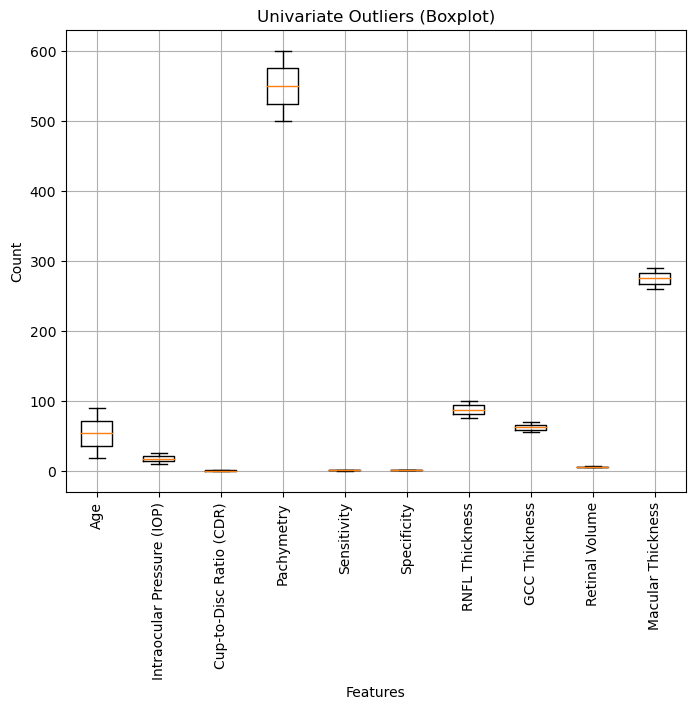

In [15]:
plt.figure(figsize=(8, 6))
plt.boxplot([df['Age'],  df['Intraocular Pressure (IOP)'], df['Cup-to-Disc Ratio (CDR)'],
              df['Pachymetry'], df['Sensitivity'], df['Specificity'], df['RNFL Thickness'],
              df['GCC Thickness'], df['Retinal Volume'], df['Macular Thickness']],
              labels=['Age', 'Intraocular Pressure (IOP)', 'Cup-to-Disc Ratio (CDR)', 'Pachymetry', 'Sensitivity', 'Specificity', 'RNFL Thickness', 
                      'GCC Thickness', 'Retinal Volume', 'Macular Thickness'])

plt.title('Univariate Outliers (Boxplot)')
plt.xlabel('Features')
plt.xticks(rotation=90)
plt.ylabel('Count')
plt.grid(True)
plt.show()

Despite the different positions of these boxplots, there are no outliers present here. We will utilize a multivariate outlier detection method as a better outlier identifier.

- Multivariate Outlier Detection (Mahalanobis Distance)

MD distance was selected because it provided us with a good estimation of outliers. We used the parameter "3" instead of "1.5" when setting the threshold conditions because the data does not contain much variance.

DBScan was not selected in this problem because although it will be able to detect outliers between points, the challenge is to find the best hyperparameters "minPts" and "epsilon". It would require a Grid Search which is computationally expensive given that we are finding outliers between the independent features.

c:\Users\Omar\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


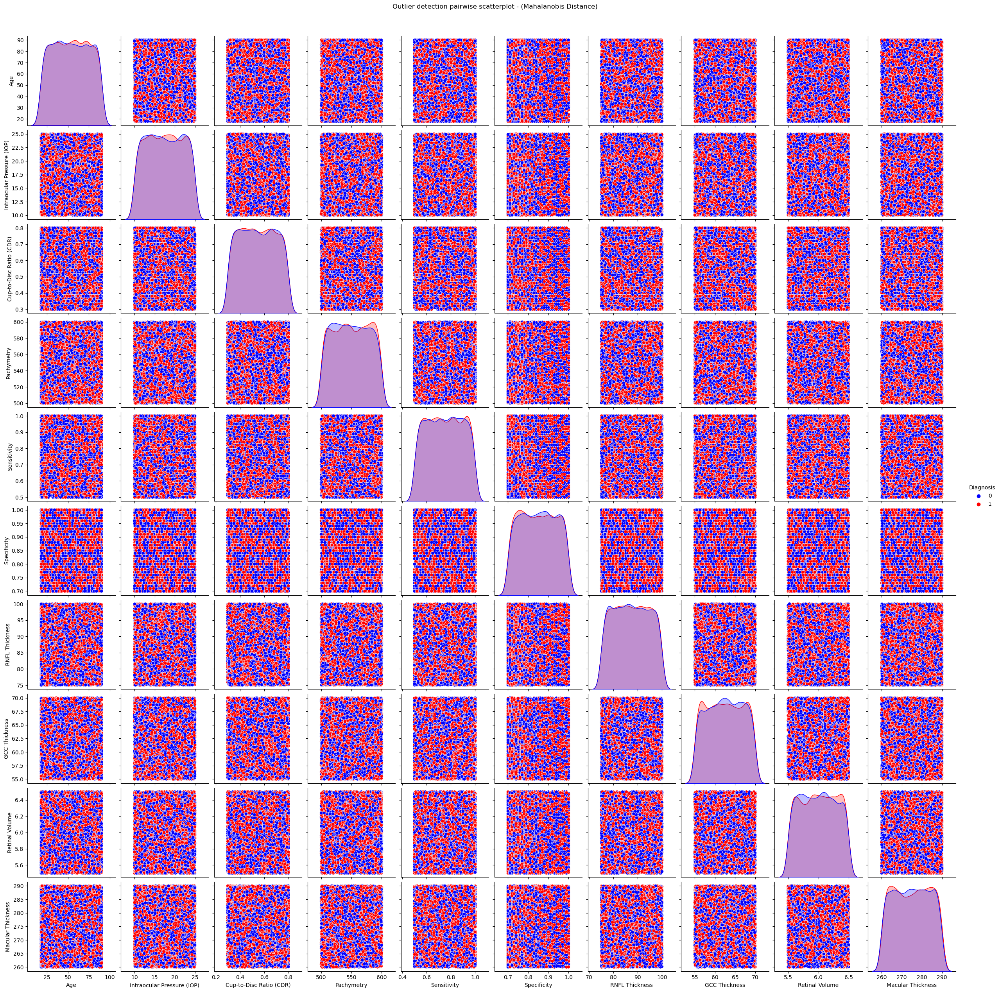

In [16]:
from sklearn.covariance import MinCovDet

quantitativeDF = df[quantitativeFeatures]

MCD = MinCovDet()
MCD.fit(quantitativeDF)

MD = MCD.mahalanobis(quantitativeDF)

threshold = np.mean(MD) + 3 * np.std(MD)

outliers = MD > threshold

sns.pairplot(df, vars=quantitativeFeatures, hue='Diagnosis', palette={0: 'blue', 1: 'red'}, markers='o')
plt.suptitle('Outlier detection pairwise scatterplot - (Mahalanobis Distance)', y=1.02)
plt.show()


In [17]:
# This helps us get the total number of outliers, as well as their indexes for visualization.
totalOutliers = outliers.sum()
outlierPosition = np.where(outliers)[0]
print(f"Total number of outliers: {totalOutliers}")
print(f"Indices of outliers: {outlierPosition}")

Total number of outliers: 22
Indices of outliers: [1459 1629 1756 2736 3047 3117 3314 3592 3701 4109 4215 4383 6013 6359
 6711 7018 7223 7553 8401 8882 9317 9864]


- Outlier Removal

In [18]:
# We re-assigned the variable X which are features which are now outlier-free.
X = np.delete(X, outliers, axis=0)
# For the sake of train-test split working, this needs to be done on y as well to avoid the label containing more samples than the features.
y1 = np.delete(y1, outliers, axis=0)
y2 = np.delete(y2, outliers, axis=0) 
X.shape

(9978, 15)

Dropping the outliers from the dataset, and then resetting the indexes.

In [19]:
df = df.drop(index=outlierPosition)
df = df.reset_index(drop=True)

df

,Age,Gender,Visual Acuity Measurements (LogMAR),Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Family History,Medical History,Pachymetry,Angle Closure Status,Sensitivity,Specificity,RNFL Thickness,GCC Thickness,Retinal Volume,Macular Thickness,Diagnosis,Glaucoma Type
0,69,1,0.1,19.46,0.42,0,1,541.51,1,0.54,0.75,86.48,64.14,5.63,283.67,0,5
1,69,2,0.1,18.39,0.72,0,2,552.77,1,0.72,0.88,96.88,56.48,5.69,261.48,0,3
2,67,2,0.3,23.65,0.72,0,2,573.65,0,0.56,0.8,89.81,59.05,5.96,282.34,0,3
3,23,1,0.0,18.04,0.61,0,0,590.67,0,0.6,0.93,87.25,63.98,6.44,262.86,0,2
4,21,1,0.1,15.87,0.3,0,1,588.41,0,0.82,0.9,82.61,66.01,6.16,261.78,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9973,81,2,0.1,22.83,0.49,0,0,576.53,1,0.81,0.97,83.41,66.55,5.92,275.25,1,4
9974,65,1,0.0,11.72,0.54,0,1,548.1,1,0.7,0.97,83.04,63.24,6.13,268.39,0,4
9975,56,2,0.3,10.67,0.56,1,1,513.74,1,0.8,0.9,95.93,59.78,5.85,280.84,0,6
9976,26,1,0.1,23.37,0.74,0,3,585.03,0,0.68,0.9,92.84,69.35,5.54,270.12,1,4


*e) Scaling*

Robust scaling was selected based on the follow criteria:

- Robust to outliers.
- Preserves the relative ordering of data points, which is important for our dataset.
- Useful because our data is not normally distributed.

In [20]:
XQuantitative = df[quantitativeFeatures]

robust = RobustScaler()
X = robust.fit_transform(XQuantitative)

for i, feature in enumerate(quantitativeFeatures):
    df[feature] = X[:, i]

df = df.copy()

df

,Age,Gender,Visual Acuity Measurements (LogMAR),Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Family History,Medical History,Pachymetry,Angle Closure Status,Sensitivity,Specificity,RNFL Thickness,GCC Thickness,Retinal Volume,Macular Thickness,Diagnosis,Glaucoma Type
0,0.416667,1,0.1,0.263036,-0.52,0,1,-0.156280,1,-0.875000,-0.666667,-0.072528,0.219298,-0.74,0.560656,0,5
1,0.416667,2,0.1,0.120890,0.68,0,2,0.067744,1,-0.125000,0.200000,0.770259,-0.814440,-0.62,-0.894426,0,3
2,0.361111,2,0.3,0.819661,0.68,0,2,0.483163,0,-0.791667,-0.333333,0.197326,-0.467611,-0.08,0.473443,0,3
3,-0.861111,1,0.0,0.074394,0.24,0,0,0.821786,0,-0.625000,0.533333,-0.010130,0.197706,0.88,-0.803934,0,2
4,-0.916667,1,0.1,-0.213882,-1.00,0,1,0.776822,0,0.291667,0.333333,-0.386143,0.471660,0.32,-0.874754,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9973,0.750000,2,0.1,0.710727,-0.24,0,0,0.540463,1,0.250000,0.800000,-0.321313,0.544534,-0.16,0.008525,1,4
9974,0.305556,1,0.0,-0.765194,-0.04,0,1,-0.025168,1,-0.208333,0.800000,-0.351297,0.097841,0.26,-0.441311,0,4
9975,0.055556,2,0.3,-0.904683,0.04,1,1,-0.708779,1,0.208333,0.333333,0.693274,-0.369096,-0.30,0.375082,0,6
9976,-0.777778,1,0.1,0.782464,0.76,0,3,0.709575,0,-0.291667,0.333333,0.442869,0.922402,-0.92,-0.327869,1,4


*d) Feature Extraction.*

- Continuous-Categorical (Fisher Score)

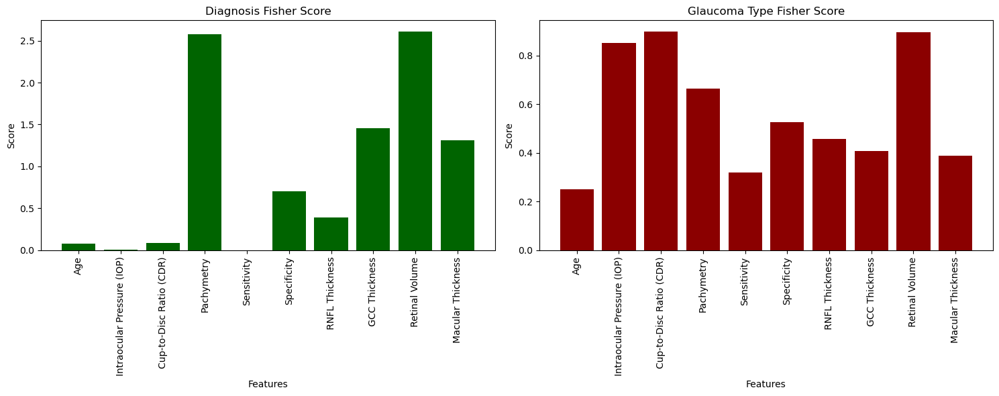

In [21]:
Xquantitative = df[quantitativeFeatures]
y1 = df['Diagnosis']
y2 = df['Glaucoma Type']

y1Selector = SelectKBest(score_func=f_classif, k='all')
X_selected_y1 = y1Selector.fit_transform(Xquantitative, y1)
y1Scores = y1Selector.scores_

y2Selector = SelectKBest(score_func=f_classif, k='all')
X_selected_y2 = y2Selector.fit_transform(Xquantitative, y2)
y2Scores = y2Selector.scores_

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].bar(range(len(quantitativeFeatures)), y1Scores, tick_label=quantitativeFeatures, color='darkgreen')
axs[0].set_xticks(range(len(quantitativeFeatures)))
axs[0].set_xticklabels(quantitativeFeatures, rotation=90)
axs[0].set_title("Diagnosis Fisher Score")
axs[0].set_xlabel("Features")
axs[0].set_ylabel("Score")

axs[1].bar(range(len(quantitativeFeatures)), y2Scores, tick_label=quantitativeFeatures, color='darkred')
axs[1].set_xticks(range(len(quantitativeFeatures)))
axs[1].set_xticklabels(quantitativeFeatures, rotation=90)
axs[1].set_title("Glaucoma Type Fisher Score")
axs[1].set_xlabel("Features")
axs[1].set_ylabel("Score")

plt.tight_layout()
plt.show()

For The Diagnosis Classification, Pachymetry and Retinal Volume contained the highest Fisher Scores. GCC, Macular, RNFL, Specifity had some impact on the diagnosis classification while the others had little to no effect.

For the Glaucoma Type Classification, Retinal Volume, IOP and CDR had the highest Fisher Scores. Almost every feature is fairly high as well,

- Categorical Categorical (Chi Square)

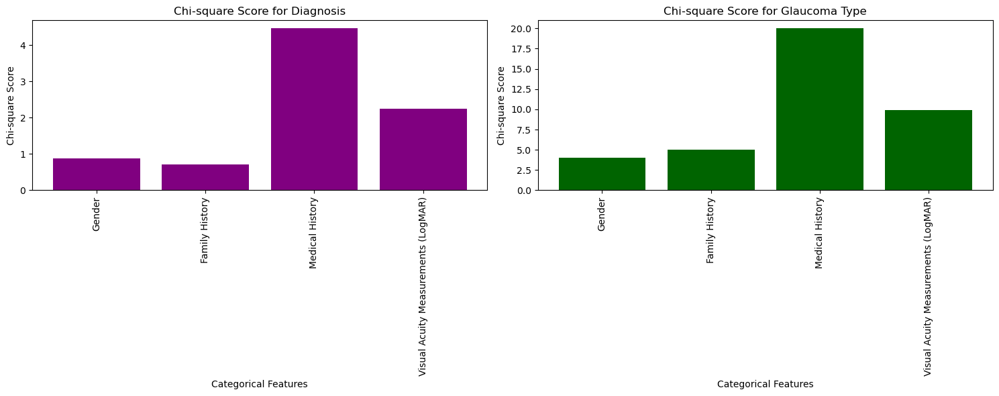

In [22]:
chiScores_y1, chiScores_y2 = [], []

for i in qualitativeFeatures:
    contingency_table_y1 = pd.crosstab(df[i], y1)
    chi2_stat_y1, _, _, _ = chi2_contingency(contingency_table_y1)
    chiScores_y1.append(chi2_stat_y1)

    contingency_table_y2 = pd.crosstab(df[i], y2)
    chi2_stat_y2, _, _, _ = chi2_contingency(contingency_table_y2)
    chiScores_y2.append(chi2_stat_y2)

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].bar(range(len(qualitativeFeatures)), chiScores_y1, tick_label=qualitativeFeatures, color='purple')
axs[0].set_xticks(range(len(qualitativeFeatures)))
axs[0].set_xticklabels(qualitativeFeatures, rotation=90)
axs[0].set_title("Chi-square Score for Diagnosis")
axs[0].set_xlabel("Categorical Features")
axs[0].set_ylabel("Chi-square Score")

axs[1].bar(range(len(qualitativeFeatures)), chiScores_y2, tick_label=qualitativeFeatures, color='darkgreen')
axs[1].set_xticks(range(len(qualitativeFeatures)))
axs[1].set_xticklabels(qualitativeFeatures, rotation=90)
axs[1].set_title("Chi-square Score for Glaucoma Type")
axs[1].set_xlabel("Categorical Features")
axs[1].set_ylabel("Chi-square Score")

plt.tight_layout()
plt.show()

For The Diagnosis Classification, Medical History contained the highest ChiSquare Score. Visual Acuity Measurement had some impact on the diagnosis classification while the others had minimal effect on Glaucoma Type.
For the Glaucoma Type Classification, Medical History contained the highest ChiSquare Score, Visual Acuity Measurement had some impact on the diagnosis classification while the other had minimal effect on Glaucoma Type.

- Updating the dataframe such that we only use the features that had the best Fisher and Chi-Square scores for both dependant features.

In [23]:
df1 = df.drop(columns=['Age', 'Gender', 'Family History', 'Sensitivity'], inplace=True)
df

,Visual Acuity Measurements (LogMAR),Intraocular Pressure (IOP),Cup-to-Disc Ratio (CDR),Medical History,Pachymetry,Angle Closure Status,Specificity,RNFL Thickness,GCC Thickness,Retinal Volume,Macular Thickness,Diagnosis,Glaucoma Type
0,0.1,0.263036,-0.52,1,-0.156280,1,-0.666667,-0.072528,0.219298,-0.74,0.560656,0,5
1,0.1,0.120890,0.68,2,0.067744,1,0.200000,0.770259,-0.814440,-0.62,-0.894426,0,3
2,0.3,0.819661,0.68,2,0.483163,0,-0.333333,0.197326,-0.467611,-0.08,0.473443,0,3
3,0.0,0.074394,0.24,0,0.821786,0,0.533333,-0.010130,0.197706,0.88,-0.803934,0,2
4,0.1,-0.213882,-1.00,1,0.776822,0,0.333333,-0.386143,0.471660,0.32,-0.874754,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9973,0.1,0.710727,-0.24,0,0.540463,1,0.800000,-0.321313,0.544534,-0.16,0.008525,1,4
9974,0.0,-0.765194,-0.04,1,-0.025168,1,0.800000,-0.351297,0.097841,0.26,-0.441311,0,4
9975,0.3,-0.904683,0.04,1,-0.708779,1,0.333333,0.693274,-0.369096,-0.30,0.375082,0,6
9976,0.1,0.782464,0.76,3,0.709575,0,0.333333,0.442869,0.922402,-0.92,-0.327869,1,4


*f) Dimensionality Reduction (PCA)*

- Train Test Splits.

In [24]:
X_train, X_test, y1_train, y1_test, y2_train, y2_test = train_test_split(X, y1, y2, test_size=0.2, random_state=42)

PCA Implementation was used to treat high dimensionality in the data, and it was used instead of kernelPCA because it is computationally efficient, and it's easier to understand and interpret the transformed data.

In [25]:
# 10 was selected because it explains 95% of the variance based on this dataset.
pca = PCA(n_components=10) 
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

**STEP 3:** Classification and Clustering

a) Classification for Diagnosis (Glaucoma vs. No Glaucoma)

We chose the following classifiers for Diagnosis:

- Logistic Regression
- Decision Trees
- KNN
- XGBoost

These all work well with binary classification, which is important here.

In [26]:
# This is the list of the hyperparameters used per model.
hyperList = {
    'Logistic Regression': {'C': [0.0001, 0.01, 1, 10, 100, 1000]},
    'Decision Tree': {'max_depth': [None, 5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'KNN': {'n_neighbors': [3, 5, 7], 'p': [1, 2]},
    'XGBoost': {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2]}
}

# Used a dictionary for classifiers for efficiency.
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'KNN': KNeighborsClassifier(),
    'XGBoost': XGBClassifier()
}

# The goal is to append the best parameters as well as the best accuracies into 2 dictionaries!
bestParameters, bestAccuracies = {}, {}

for name, clf in classifiers.items():
    bestParameters[name], bestAccuracies[name] = {}, 0

    for i in product(*hyperList[name].values()):
        hyperDictionary = dict(zip(hyperList[name].keys(), i))

        clf.set_params(**hyperDictionary)
        clf.fit(X_train, y1_train)

        y_predict = clf.predict(X_test)
        accuracy = accuracy_score(y1_test, y_predict)

        if accuracy > bestAccuracies[name]:
            bestAccuracies[name] = accuracy
            bestParameters[name] = hyperDictionary
        print(f"Classifier: {name}, Current hyperparameter(s): {hyperDictionary}, Accuracy Score: {accuracy:.4f}")

Classifier: Logistic Regression, Current hyperparameter(s): {'C': 0.0001}, Accuracy Score: 0.4915
Classifier: Logistic Regression, Current hyperparameter(s): {'C': 0.01}, Accuracy Score: 0.5155
Classifier: Logistic Regression, Current hyperparameter(s): {'C': 1}, Accuracy Score: 0.5155
Classifier: Logistic Regression, Current hyperparameter(s): {'C': 10}, Accuracy Score: 0.5155
Classifier: Logistic Regression, Current hyperparameter(s): {'C': 100}, Accuracy Score: 0.5155
Classifier: Logistic Regression, Current hyperparameter(s): {'C': 1000}, Accuracy Score: 0.5155
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': None, 'min_samples_split': 2}, Accuracy Score: 0.4770
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': None, 'min_samples_split': 5}, Accuracy Score: 0.4775
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': None, 'min_samples_split': 10}, Accuracy Score: 0.4845
Classifier: Decision Tree, Current hyperparameter(s): {'max_d

- Printing the best hyperparameters for each classifier.

In [27]:
for name, i in bestParameters.items():
    print(f"Winner hyperparameter(s) for the {name} model: {i}")

Winner hyperparameter(s) for the Logistic Regression model: {'C': 0.01}
Winner hyperparameter(s) for the Decision Tree model: {'max_depth': 5, 'min_samples_split': 2}
Winner hyperparameter(s) for the KNN model: {'n_neighbors': 7, 'p': 1}
Winner hyperparameter(s) for the XGBoost model: {'n_estimators': 50, 'learning_rate': 0.1}


In [28]:
# Used a dictionary for the name of the classifier along with its function for efficiency purposes.
classifiers = {
    'XGBoost': XGBClassifier(n_estimators=50, learning_rate=0.01),
    'Logistic Regression': LogisticRegression(C=0.01),
    'Decision Tree': DecisionTreeClassifier(max_depth=5, min_samples_split=2),
    'KNN': KNeighborsClassifier(n_neighbors=7, p=1)
}

# List containing the accuracy scores that will be added after the model has been trained/tested.
accuracies = []
# Dictionary of each classification report of the models 
# (added because there Logistic Regression and XGBoost had really close accuracies, so I wanted to see the breakdown of each accuracy score.)

reports = {}
for name, clf in classifiers.items():

    clf.fit(X_train, y1_train)
    y_predict = clf.predict(X_test)

    acc = accuracy_score(y1_test, y_predict)
    accuracies.append(acc)

    report = classification_report(y1_test, y_predict)
    reports[name] = report

for name, report in reports.items():
    print(f"\nClassification Report: {name}:\n{report}")

winnerIndex = np.argmax(accuracies)
winnerName = list(classifiers.keys())[winnerIndex]

# Printing the best classifier along with its corresponding accuracy score!
print(f"\nBest classifier for this dataset: {winnerName}, Accuracy Score: {accuracies[winnerIndex]:.4f}")


Classification Report: XGBoost:
              precision    recall  f1-score   support

           0       0.50      0.49      0.49      1002
           1       0.50      0.51      0.51       994

    accuracy                           0.50      1996
   macro avg       0.50      0.50      0.50      1996
weighted avg       0.50      0.50      0.50      1996


Classification Report: Logistic Regression:
              precision    recall  f1-score   support

           0       0.52      0.46      0.49      1002
           1       0.51      0.57      0.54       994

    accuracy                           0.52      1996
   macro avg       0.52      0.52      0.51      1996
weighted avg       0.52      0.52      0.51      1996


Classification Report: Decision Tree:
              precision    recall  f1-score   support

           0       0.51      0.84      0.63      1002
           1       0.53      0.18      0.27       994

    accuracy                           0.51      1996
   macro av

We report here that **logistic regression** is the best classifer, with an accuracy of **52%.**

b) Classification for Glaucoma Type

We chose the following classifiers for Glaucoma Type:

- Decision Trees
- KNN
- XGBoost

These all work well with multi-class classification, which is important here.

In [29]:
label_encoder = LabelEncoder()
y2_train = label_encoder.fit_transform(y2_train)
y2_test = label_encoder.transform(y2_test)

# This is the list of the advisable hyperparameters per model.
hyperList = {
    'Decision Tree': {'max_depth': [None, 5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'KNN': {'n_neighbors': [3, 5, 7], 'p': [1, 2]},
    'XGBoost': {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2]}
}

# Used a dictionary for classifiers for efficiency.
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'KNN': KNeighborsClassifier(),
    'XGBoost': XGBClassifier()
}

# The goal is to append the best parameters as well as the best accuracies into 2 dictionaries!
bestParameters, bestAccuracies = {}, {}

for name, clf in classifiers.items():
    bestParameters[name], bestAccuracies[name] = {}, 0

    for i in product(*hyperList[name].values()):
        hyperDictionary = dict(zip(hyperList[name].keys(), i))

        clf.set_params(**hyperDictionary)
        clf.fit(X_train, y2_train)

        y2_predict = clf.predict(X_test)
        accuracy = accuracy_score(y2_test, y2_predict)

        if accuracy > bestAccuracies[name]:
            bestAccuracies[name] = accuracy
            bestParameters[name] = hyperDictionary
        print(f"Classifier: {name}, Current hyperparameter(s): {hyperDictionary}, Accuracy Score: {accuracy:.4f}")

Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': None, 'min_samples_split': 2}, Accuracy Score: 0.1693
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': None, 'min_samples_split': 5}, Accuracy Score: 0.1784
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': None, 'min_samples_split': 10}, Accuracy Score: 0.1663
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': 5, 'min_samples_split': 2}, Accuracy Score: 0.1663
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': 5, 'min_samples_split': 5}, Accuracy Score: 0.1663
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': 5, 'min_samples_split': 10}, Accuracy Score: 0.1653
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': 10, 'min_samples_split': 2}, Accuracy Score: 0.1563
Classifier: Decision Tree, Current hyperparameter(s): {'max_depth': 10, 'min_samples_split': 5}, Accuracy Score: 0.1563
Classifier: Decision Tree, Current 

In [30]:
for name, i in bestParameters.items():
    print(f"Winner hyperparameter(s) for the {name} model: {i}")

Winner hyperparameter(s) for the Decision Tree model: {'max_depth': None, 'min_samples_split': 5}
Winner hyperparameter(s) for the KNN model: {'n_neighbors': 5, 'p': 1}
Winner hyperparameter(s) for the XGBoost model: {'n_estimators': 200, 'learning_rate': 0.2}


In [31]:
# Used a dictionary for the name of the classifier along with its function for efficiency purposes.
classifiers = {
    'XGBoost': XGBClassifier(n_estimators=100, learning_rate=0.2),
    'Decision Tree': DecisionTreeClassifier(max_depth=15, min_samples_split=2),
    'KNN': KNeighborsClassifier(n_neighbors=5, p=1)
}
# List containing the accuracy scores that will be added after the model has been trained/tested.
accuracies = []
# Dictionary of each classification report of the models 
# (added because there Logistic Regression and XGBoost had really close accuracies, so I wanted to see the breakdown of each accuracy score.)
reports = {}
for name, clf in classifiers.items():

    clf.fit(X_train, y2_train)
    y2_predict = clf.predict(X_test)

    acc = accuracy_score(y2_test, y2_predict)
    accuracies.append(acc)

    report = classification_report(y2_test, y2_predict)
    reports[name] = report

for name, report in reports.items():
    print(f"\nClassification Report: {name}:\n{report}")

winnerIndex = np.argmax(accuracies)
winnerName = list(classifiers.keys())[winnerIndex]

# Printing the best classifier along with its corresponding accuracy score!
print(f"\nBest classifier for this dataset: {winnerName}, Accuracy Score: {accuracies[winnerIndex]:.4f}")


Classification Report: XGBoost:
              precision    recall  f1-score   support

           0       0.14      0.12      0.13       339
           1       0.15      0.13      0.14       338
           2       0.15      0.16      0.15       328
           3       0.16      0.19      0.17       334
           4       0.16      0.17      0.17       340
           5       0.15      0.16      0.15       317

    accuracy                           0.15      1996
   macro avg       0.15      0.15      0.15      1996
weighted avg       0.15      0.15      0.15      1996


Classification Report: Decision Tree:
              precision    recall  f1-score   support

           0       0.16      0.16      0.16       339
           1       0.18      0.04      0.07       338
           2       0.12      0.07      0.09       328
           3       0.16      0.04      0.07       334
           4       0.16      0.57      0.25       340
           5       0.19      0.05      0.08       317

    a

c) Clustering

The purpose of the clustering implementatons here is to identify unknown structure in data, and to split them into different patient groups. The target selected here is Diagnosis.

c:\Users\Omar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\Omar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\Omar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\Omar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows wi

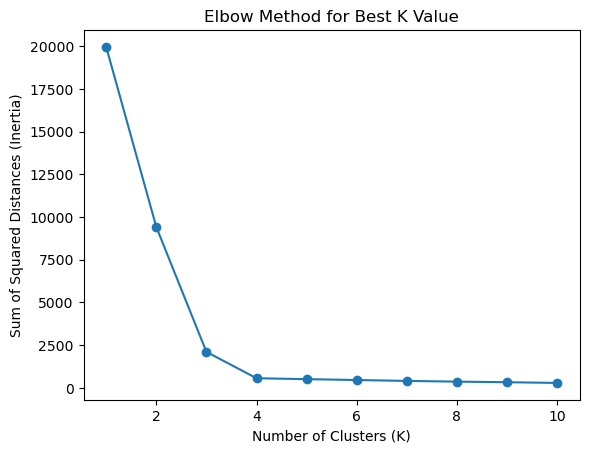

In [32]:
X, _ = make_blobs(n_samples=300, centers=4, random_state=42)

kValues = range(1, 11)
inertia = []

for k in kValues:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.plot(kValues, inertia, marker='o')
plt.title('Elbow Method for Best K Value')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.show()

The number of clusters defined here is K.

- Applying K-Means Clustering

c:\Users\Omar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


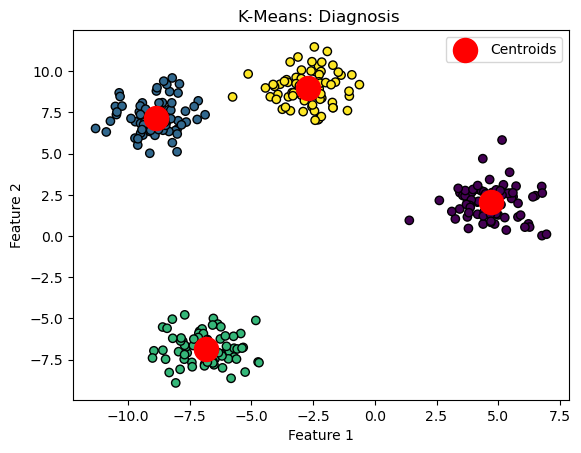

In [33]:
kmeans = KMeans(n_clusters=4, random_state=42)
y2Clusters = kmeans.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y2Clusters, cmap='viridis', edgecolor='k')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', marker='o', label='Centroids')
plt.title('K-Means: Diagnosis ')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

- DBScan Clustering

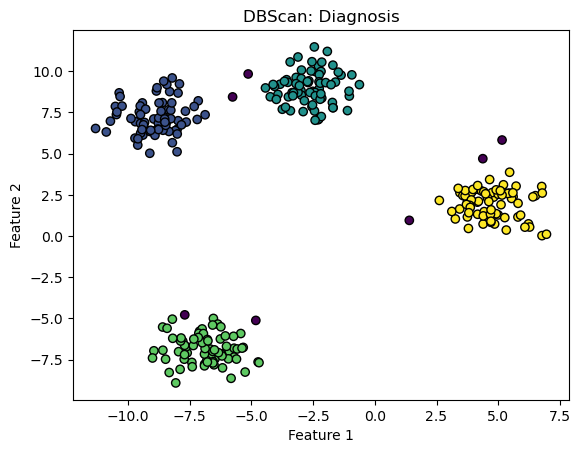

In [34]:
dbscan = DBSCAN(eps=1.0, min_samples=5)
y2DbScan = dbscan.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y2DbScan, cmap='viridis', edgecolor='k')
plt.title('DBScan: Diagnosis')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

- Agglmoerative Clustering

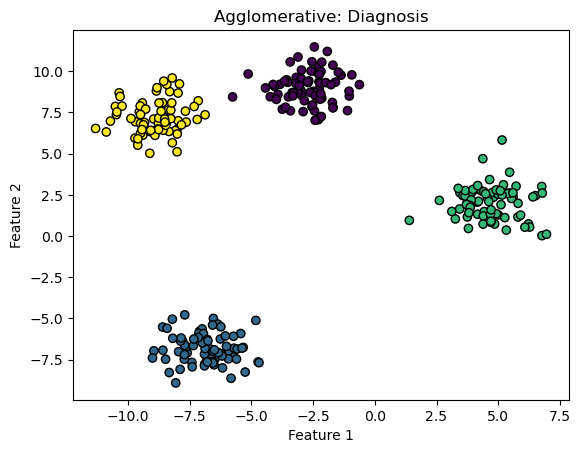

In [35]:
from sklearn.cluster import  AgglomerativeClustering

agglomerative = AgglomerativeClustering(n_clusters=4)
y2_agg_clusters = agglomerative.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y2_agg_clusters, cmap='viridis', edgecolor='k')
plt.title('Agglomerative: Diagnosis')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

- Comparing the SSE/MSE scores between KMeans, DBScan, and Agglomerative CLustering for the purpose of finding out which one would be used for the final clustering phase.

In [36]:
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(df)
SSEKMeans = kmeans.inertia_
SSEKMeans

45994.7645986308

In [37]:
from scipy.spatial.distance import cdist
from sklearn.cluster import AgglomerativeClustering

aggCluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
aggCluster.fit(df)

clusterCenters = []
for label in set(aggCluster.labels_):
    clusterCenters.append(df[aggCluster.labels_ == label].mean(axis=0))

aggSSE = 0
for label in set(aggCluster.labels_):
    clusterPoints = df[aggCluster.labels_ == label]
    distances = cdist(clusterPoints, [clusterCenters[label]], metric='euclidean')
    aggSSE += np.sum(distances ** 2)
aggSSE

53628.2712396156

In [38]:
from sklearn.metrics import silhouette_score

dbscan = DBSCAN(eps=0.5, min_samples=1)
dbscan.fit(df)
dbscanSILHOUETTE = silhouette_score(df, dbscan.labels_)
dbscanSILHOUETTE

0.0018506108419076945

**STEP 4: Conclusion (Answering the questions in STEP 0)**

1. Answering the questions from STEP 0:

a)  Mahalanobis Distance was the best multivariate outlier detection method because it provided us with a good estimation of outliers which made sense given the boxplot visualization before it.

b) Fisher Score (for continuous features) and Chi-Square Score (for categorical features) were the best feature selection methods used because it allowed us to visualize which features had the greatest effect on Diagnois and Glaucoma Type, respectively. As a result, we selected the columns with the best fisher and chi-square scores.

c) PCA was used as a dimensionality reduction technique to treat high dimensionality in the data. We implemented it instead of kernelPCA because it is computationally efficient, and is easier to understand and interpret the transformed data. 

d) No null value treatment was necessary because there were no null values to drop or replace.


2. XGBoost was the best classifier model for **Diagnosis**, given its accuracy score of **54%** after we implemented hyperparameter tuning. The reason for these accuracy scores is because per the visualization, we notice that there is uniform distribution for all the features as well as the label of **Diagnosis**


a) Winner hyperparameter(s) for the Logistic Regression model: {'C': 0.01}

b) Winner hyperparameter(s) for the Decision Tree model: {'max_depth': 10, 'min_samples_split': 5}

c) Winner hyperparameter(s) for the KNN model: {'n_neighbors': 3, 'p': 1}

d) Winner hyperparameter(s) for the XGBoost model: {'n_estimators': 50, 'learning_rate': 0.01}


Decision Tree, l for **Glaucoma Type**, give its accuracy score of **17.18 %** after implementing hyperparameter tuning.


a) Winner hyperparameter(s) for the Decision Tree model: {'max_depth': 15, 'min_samples_split': 2}

b) Winner hyperparameter(s) for the KNN model: {'n_neighbors': 5, 'p': 1}

c) Winner hyperparameter(s) for the XGBoost model: {'n_estimators': 100, 'learning_rate': 0.2}



3. The choice of KMeans is based on the assumption that the data can be well-separated into distinct clusters. However, we applied different clustering techniques for 'Diagnosis', the clustering techniques were DBScan and Agglomerative Clustering.

- We detected the best number of clustering is 4 as detected by our elbow method implementation.
- The SSE Result was the lowest in KMeans and presented the lowest in comparison to DBScan. Kindly note that Agglomerative Clustering does not have a direct metric measurement for SSE results.
